In [1]:
%load_ext autoreload
%autoreload 2
import hippo
from rich import print
import pandas as pd
from pathlib import Path

In [3]:
animal = hippo.HIPPO("RdRp_FFF", "bulkdock_snapshot.sqlite") #, copy_from="../../BulkDock/TARGETS/Flavi_NS5_RdRp/Flavi_NS5_RdRp.sqlite", overwrite_existing=True)

 Creating HIPPO animal

name = RdRp_FFF

db_path = bulkdock_snapshot.sqlite

DEBUG: hippo.Database.__init__()

DEBUG: Database.path = bulkdock_snapshot.sqlite

DEBUG: hippo.Database.connect()

DEBUG: sqlite3.version='2.6.0'

 Success  Database connected @ bulkdock_snapshot.sqlite!

 Success  Initialised animal HIPPO("RdRp_FFF")!

## Add site tags to fragment derivatives

In [7]:
MERGING = {
    "cavity_b":'[Other] Cavity B (S3) (P2)',
    "green_site_rna_tunnel":'[Other] Green Site/RNA tunnel (P2)',
    "thumb_site_2":'[Other] Thumb Site 2 (P2)',
    "primer_grip_n_pocket":'[Other] Primer grip/N-pocket (P2)'
}

In [19]:
for nickname, tag in MERGING.items():
    frags = animal.poses(tag=tag)
    print(frags)
    derivatives = frags.derivatives
    print(derivatives)


    sql = """
    INSERT OR IGNORE INTO tag(tag_name, tag_pose)
    VALUES(?1, ?2)
    """

    # frags
    values = [(f"{nickname} frag", i) for i in frags.ids]
    animal.db.executemany(sql, values)
    animal.db.commit()

    # derivatives
    values = [(f"{nickname} merge", i) for i in derivatives.ids]
    animal.db.executemany(sql, values)
    animal.db.commit()


poses tagged "[Other] Cavity B (S3) (P2)": {P × 14}

derivatives of poses tagged "[Other] Cavity B (S3) (P2)": {P × 14}: {P × 1657}

poses tagged "[Other] Green Site/RNA tunnel (P2)": {P × 48}

derivatives of poses tagged "[Other] Green Site/RNA tunnel (P2)": {P × 48}: {P × 19239}

poses tagged "[Other] Thumb Site 2 (P2)": {P × 35}

derivatives of poses tagged "[Other] Thumb Site 2 (P2)": {P × 35}: {P × 8952}

poses tagged "[Other] Primer grip/N-pocket (P2)": {P × 30}

derivatives of poses tagged "[Other] Primer grip/N-pocket (P2)": {P × 30}: {P × 58597}

Querying database for 88779 poses...

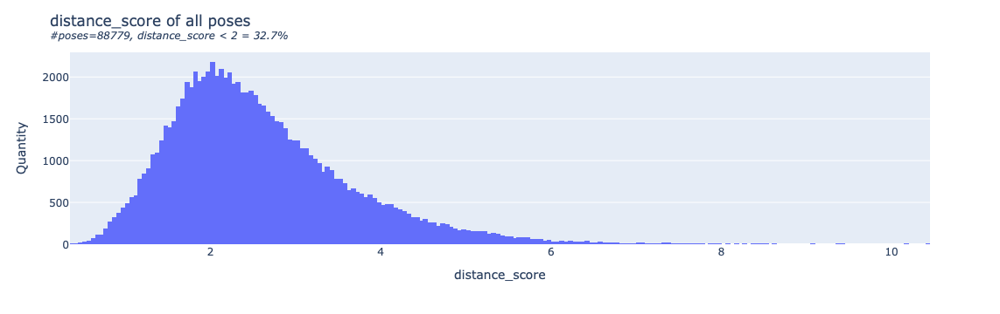

In [4]:
animal.plot_pose_property("distance_score")

Querying database for 1657 poses...

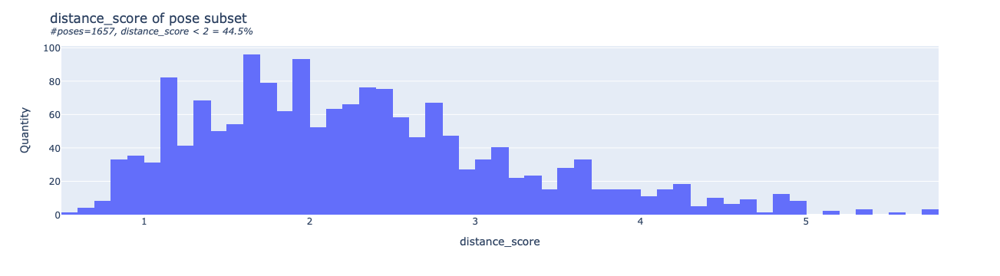

In [20]:
animal.plot_pose_property("distance_score", poses=animal.poses(tag="cavity_b merge"))

Querying database for 58597 poses...

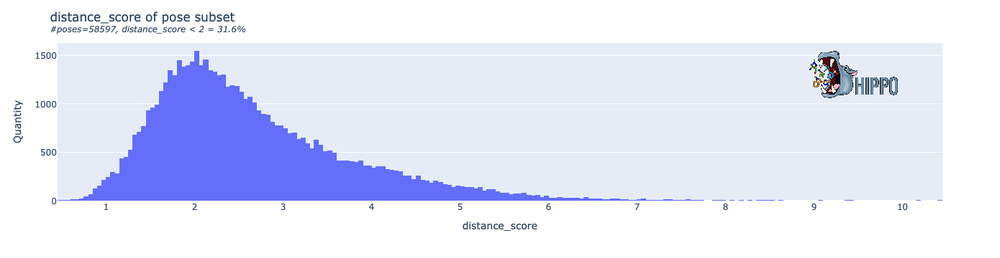

In [23]:
animal.plot_pose_property("distance_score", poses=animal.poses(tag="primer_grip_n_pocket merge"))

Querying database for 8952 poses...

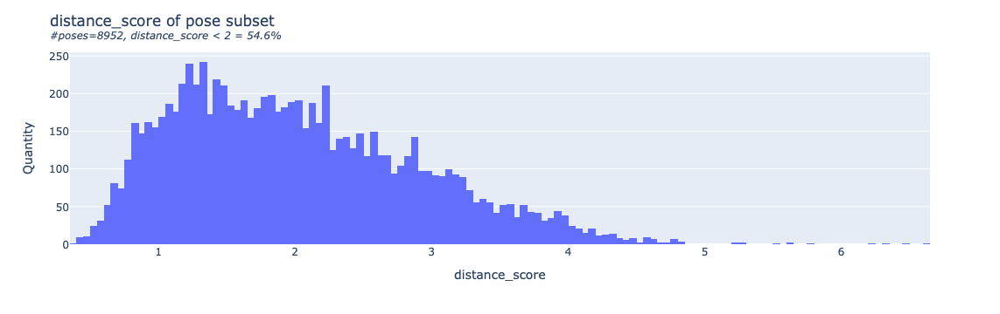

In [22]:
animal.plot_pose_property("distance_score", poses=animal.poses(tag="thumb_site_2 merge"))

Querying database for 19239 poses...

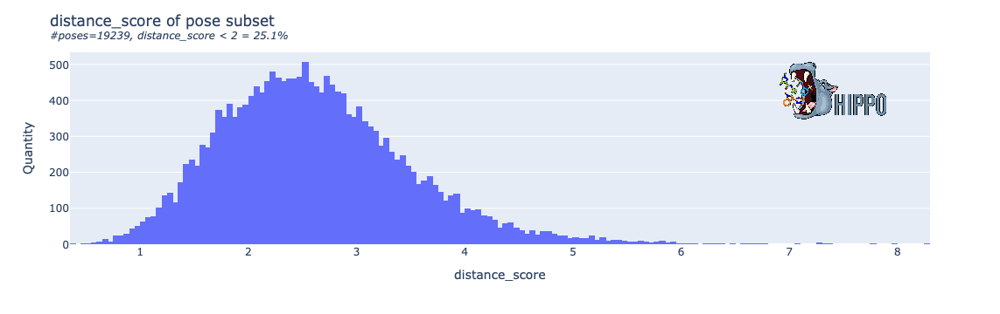

In [21]:
animal.plot_pose_property("distance_score", poses=animal.poses(tag="green_site_rna_tunnel merge"))

In [8]:
for nickname in MERGING:
    n = animal.db.execute(f"""
    SELECT COUNT(1) 
    FROM pose
    INNER JOIN tag
    ON pose_id = tag_pose
    WHERE tag_name = "{nickname} merge"
    AND pose_distance_score < 2
    """).fetchone()
    print(nickname, n)

cavity_b
(737,)

green_site_rna_tunnel
(4833,)

thumb_site_2
(4885,)

primer_grip_n_pocket
(18516,)

In [8]:
for nickname in MERGING:
    n = animal.db.execute(f"""
    SELECT COUNT(1) 
    FROM pose
    INNER JOIN tag
    ON pose_id = tag_pose
    WHERE tag_name = "{nickname} merge"
    AND pose_distance_score < 2
    """).fetchone()
    print(nickname, n)

cavity_b
(737,)

green_site_rna_tunnel
(4833,)

thumb_site_2
(4885,)

primer_grip_n_pocket
(18516,)

In [5]:
animal.poses[7730,7731].interactive()

Output()

In [ ]:
# nickname: #<1
cavity_b:(81,737,)
green_site_rna_tunnel:(197,4833)
thumb_site_2:(1014,4885)
primer_grip_n_pocket:(647,18516)

In [10]:
PSETS = {}
for nickname in MERGING:
    n = animal.db.execute(f"""
    SELECT pose_id 
    FROM pose
    INNER JOIN tag
    ON pose_id = tag_pose
    WHERE tag_name = "{nickname} merge"
    AND pose_distance_score < 1
    """).fetchall()
    print(nickname, len(n))
    PSETS[nickname] = animal.poses[[i for i, in n]]

cavity_b 81

green_site_rna_tunnel 197

thumb_site_2 1014

primer_grip_n_pocket 647

In [11]:
import plotly.express as px

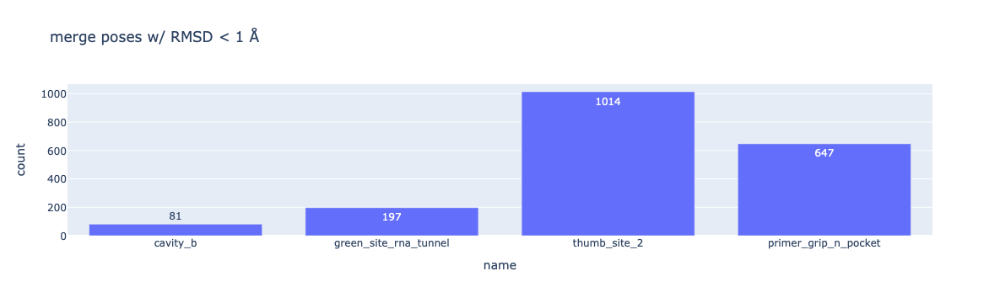

In [25]:
data = [dict(name=k, count=len(v)) for k,v in PSETS.items()]
fig = px.bar(data, x="name", y="count", text="count", title="merge poses w/ RMSD < 1 Å")
fig

In [23]:
# BUSTED = {k:v.filter(lambda x: x.posebusters()) for k,v in PSETS.items()}

# BUSTED = {}
for k,v in PSETS.items():
    for pose in v:
        print(pose, pose.posebusters())
    break


C166->P238: "ARHUQRHPFNJNHZ-UHFFFAOYSA-N" True

C166->P239: "ARHUQRHPFNJNHZ-UHFFFAOYSA-N" True

C168->P242: "HPUJEIMMYALGAW-UHFFFAOYSA-N" True

C169->P244: "RVHUWSGTGDXTPS-UHFFFAOYSA-N" True

C175->P254: "PJBAKSLHALNDDK-SSDOTTSWSA-N" True

C175->P255: "PJBAKSLHALNDDK-SSDOTTSWSA-N" True

C176->P257: "LQSUZXSSOHRNPJ-SSDOTTSWSA-N" True

C180->P262: "XRIYDZMMTAUFAN-SSDOTTSWSA-N" True

C201->P282: "ZAHDGJWEISADEG-SSDOTTSWSA-N" True

C734->P299: "QOAMYTSWHMHASV-UHFFFAOYSA-N" True

C743->P301: "DOGOWZSMZXLRRH-VIFPVBQESA-N" True

C220->P302: "QSJKZRMWFDWICK-UHFFFAOYSA-N" True

C220->P304: "QSJKZRMWFDWICK-UHFFFAOYSA-N" True

C224->P307: "KMDSPLKUYZTKHA-UHFFFAOYSA-N" True

C234->P312: "XRMSPKKKPYMDOG-UHFFFAOYSA-N" True

C234->P313: "XRMSPKKKPYMDOG-UHFFFAOYSA-N" True

C293->P597: "QRBNIDTXZBTKIO-CQSZACIVSA-N" True

C293->P600: "QRBNIDTXZBTKIO-CQSZACIVSA-N" True

C316->P731: "HJLAZNIQDJRFSN-UHFFFAOYSA-N" True

C334->P1108: "ICKYEHSEVFFHNN-UHFFFAOYSA-N" True

C341->P1204: "WZRAVWCMDRGDQR-UHFFFAOYSA-N" True

C568->P9243: "DOOVMQBYFDXPQF-VHSXEESVSA-N" True

C734->P18567: "QOAMYTSWHMHASV-UHFFFAOYSA-N" True

C743->P18569: "DOGOWZSMZXLRRH-VIFPVBQESA-N" True

C166->P18732: "ARHUQRHPFNJNHZ-UHFFFAOYSA-N" True

C166->P18734: "ARHUQRHPFNJNHZ-UHFFFAOYSA-N" True

C168->P18739: "HPUJEIMMYALGAW-UHFFFAOYSA-N" True

C169->P18745: "RVHUWSGTGDXTPS-UHFFFAOYSA-N" True

C175->P18779: "PJBAKSLHALNDDK-SSDOTTSWSA-N" True

C175->P18781: "PJBAKSLHALNDDK-SSDOTTSWSA-N" True

C176->P18791: "LQSUZXSSOHRNPJ-SSDOTTSWSA-N" True

C180->P18805: "XRIYDZMMTAUFAN-SSDOTTSWSA-N" True

C201->P18909: "ZAHDGJWEISADEG-SSDOTTSWSA-N" True

C220->P19025: "QSJKZRMWFDWICK-UHFFFAOYSA-N" True

C220->P19027: "QSJKZRMWFDWICK-UHFFFAOYSA-N" True

C224->P19039: "KMDSPLKUYZTKHA-UHFFFAOYSA-N" True

C234->P19059: "XRMSPKKKPYMDOG-UHFFFAOYSA-N" True

C234->P19065: "XRMSPKKKPYMDOG-UHFFFAOYSA-N" True

C293->P19467: "QRBNIDTXZBTKIO-CQSZACIVSA-N" True

C293->P19472: "QRBNIDTXZBTKIO-CQSZACIVSA-N" True

C316->P19651: "HJLAZNIQDJRFSN-UHFFFAOYSA-N" True

C334->P21968: "ICKYEHSEVFFHNN-UHFFFAOYSA-N" True

C341->P23010: "WZRAVWCMDRGDQR-UHFFFAOYSA-N" True

C734->P34768: "QOAMYTSWHMHASV-UHFFFAOYSA-N" True

C743->P34770: "DOGOWZSMZXLRRH-VIFPVBQESA-N" True

C166->P34786: "ARHUQRHPFNJNHZ-UHFFFAOYSA-N" True

C166->P34788: "ARHUQRHPFNJNHZ-UHFFFAOYSA-N" True

C168->P34793: "HPUJEIMMYALGAW-UHFFFAOYSA-N" True

C169->P34795: "RVHUWSGTGDXTPS-UHFFFAOYSA-N" True

C734->P34825: "QOAMYTSWHMHASV-UHFFFAOYSA-N" True

C743->P34829: "DOGOWZSMZXLRRH-VIFPVBQESA-N" True

C166->P34853: "ARHUQRHPFNJNHZ-UHFFFAOYSA-N" True

C166->P34855: "ARHUQRHPFNJNHZ-UHFFFAOYSA-N" True

C168->P34862: "HPUJEIMMYALGAW-UHFFFAOYSA-N" True

C169->P34867: "RVHUWSGTGDXTPS-UHFFFAOYSA-N" True

C175->P34892: "PJBAKSLHALNDDK-SSDOTTSWSA-N" True

C175->P34893: "PJBAKSLHALNDDK-SSDOTTSWSA-N" True

C176->P34902: "LQSUZXSSOHRNPJ-SSDOTTSWSA-N" True

C180->P34917: "XRIYDZMMTAUFAN-SSDOTTSWSA-N" True

C201->P35112: "ZAHDGJWEISADEG-SSDOTTSWSA-N" True

C220->P35263: "QSJKZRMWFDWICK-UHFFFAOYSA-N" True

C220->P35264: "QSJKZRMWFDWICK-UHFFFAOYSA-N" True

C224->P35280: "KMDSPLKUYZTKHA-UHFFFAOYSA-N" True

C234->P35309: "XRMSPKKKPYMDOG-UHFFFAOYSA-N" True

C234->P35313: "XRMSPKKKPYMDOG-UHFFFAOYSA-N" True

C293->P35847: "QRBNIDTXZBTKIO-CQSZACIVSA-N" True

C293->P35862: "QRBNIDTXZBTKIO-CQSZACIVSA-N" True

C316->P36080: "HJLAZNIQDJRFSN-UHFFFAOYSA-N" True

C334->P36833: "ICKYEHSEVFFHNN-UHFFFAOYSA-N" True

C341->P36977: "WZRAVWCMDRGDQR-UHFFFAOYSA-N" True

C568->P39393: "DOOVMQBYFDXPQF-VHSXEESVSA-N" True

C66289->P55394: "CZPICAMLPOGNFV-UHFFFAOYSA-N" True

C66292->P55400: "XDONIJPEZJLCMB-UHFFFAOYSA-N" False

C66302->P55410: "JUPWGDGDXRJYAC-VYUIOLGVSA-N" False

C66302->P55411: "JUPWGDGDXRJYAC-VYUIOLGVSA-N" True

C66330->P55453: "MWZNNKNRJZOYAY-FXQIFTODSA-N" True

C66334->P55457: "MIKXQOLGEQIPNQ-CIQUZCHMSA-N" True

C66334->P55458: "MIKXQOLGEQIPNQ-CIQUZCHMSA-N" True

C66341->P55465: "CVLKLPOGTMPILU-UHFFFAOYSA-N" False

C66343->P55467: "KBUSMXYELCJDLT-UHFFFAOYSA-N" False

C66377->P55495: "FXWUFOGGNPSQNU-UHFFFAOYSA-N" True

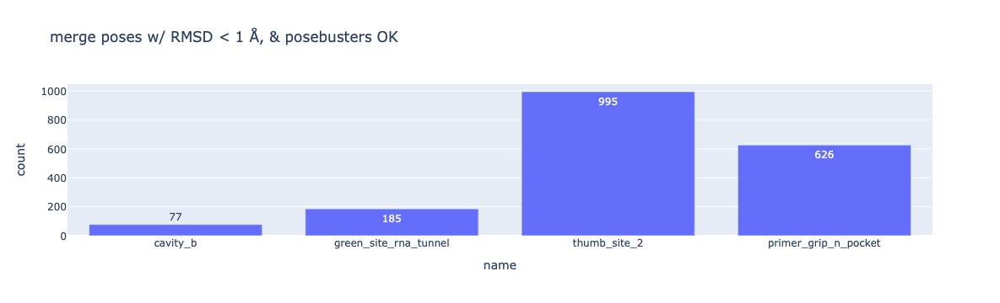

In [26]:
data = [dict(name=k, count=len(v)) for k,v in BUSTED.items()]
fig = px.bar(data, x="name", y="count", text="count", title="merge poses w/ RMSD < 1 Å, & posebusters OK")
fig